In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import math
import seaborn as sns
import sklearn
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
%matplotlib inline
sns.set_style('white')
pd.options.display.float_format = '{:.3f}'.format

from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error

# Final Capstone
## Predicting Taxi Fares in New York City
   My final capstone will work to predict taxi fare prices throughout New York City using data that includes GPS coordinates from pickup and dropoff locations, fare prices of each ride, and the number of riders of each ride. This would be useful for taxi fare companies who seek to stay competitive with rideshare companies like Uber and Lyft. Examination of the data will allow for insight into the time of day where taxi cabs are most used allowing for the deploying of the optimal amount of taxi drivers. Popular drop off/pick up points could be examined to provide more space at heavily trafficked drop off zones.

The data was obtained using the NYC Taxi Data API. The dataset is rather large with over 55 million rows of data. The dataset contains rides between 2009 and 2015. Sample data by a percentage 

Figure out congestion time split dummy variables
12-4
4-8
8-12
12-4
8-12

Possible research Questions

- What kind of information can we obtain from clustering?
- What machine learning technique is best 

In [2]:
#taxi_test_data = pd.read_csv(r'C:\\Users\\david\Final Capstone\\NYC Taxi Data\\test.csv')
taxi_train_data = pd.read_csv(r'C:\\Users\\david\Final Capstone\\NYC Taxi Data\\train.csv', nrows = 2_750_000)

#using 5% of the data
#C:\Users\david\Final Capstone\NYC Taxi Data

In [3]:
#X_train, X_test = train_test_split(taxi_train_data, test_size=0.4, random_state=0)

In [4]:
#taxi_test_data.dtypes

In [5]:
null_count = taxi_train_data.isnull().sum()
null_count[null_count>0]

dropoff_longitude    22
dropoff_latitude     22
dtype: int64

In [6]:
taxi_train_data = taxi_train_data.dropna(how ='any', axis = 'rows')

In [7]:
taxi_train_data = taxi_train_data.drop(['key','passenger_count'], axis=1)

In [8]:
taxi_train_data.shape

(2749978, 6)

In [9]:
taxi_train_data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,2749978.000,2749978.000,2749978.000,2749978.000,2749978.000
mean,11.340,-72.517,39.926,-72.517,39.921
std,9.828,13.153,8.513,12.808,10.155
min,-62.000,-3426.609,-3488.080,-3408.430,-3488.080
25%,6.000,-73.992,40.735,-73.991,40.734
50%,8.500,-73.982,40.753,-73.980,40.753
75%,12.500,-73.967,40.767,-73.964,40.768
max,1273.310,3439.426,2912.465,3414.307,3345.917


It looks like there are some extreme outliers in the case of latitude and longitude. Let's bound everything so it includes datapoints that are within New York City. The min is about -74 for longitude and about 41 for latitude. Let's create a function that adds 5 degrees. 

https://www.mapdevelopers.com/geocode_bounding_box.php

In [10]:
-74.5, -72.8, 40.5, 41.8

def clean_df(taxi_train_data):
    return taxi_train_data[(taxi_train_data.pickup_longitude > -74.259090) & (taxi_train_data.pickup_longitude < -73.70072) &
        (taxi_train_data.pickup_latitude > 40.477399 ) & (taxi_train_data.pickup_latitude < 40.917577) &
        (taxi_train_data.dropoff_longitude > -74.259090) & (taxi_train_data.dropoff_longitude < -73.70072) &
        (taxi_train_data.dropoff_latitude > 40.477399 ) & (taxi_train_data.dropoff_latitude < 40.917577)] 

taxi_train_data = clean_df(taxi_train_data)
print(len(taxi_train_data))

2688786


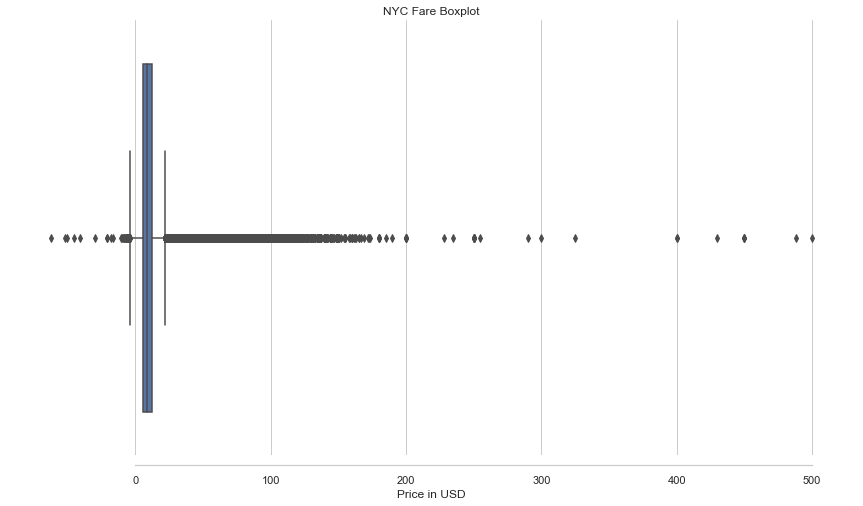

In [11]:
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

ax = sns.boxplot(x=taxi_train_data['fare_amount'])  

plt.title('NYC Fare Boxplot')

sns.despine(offset=10, trim=True)
ax.set(xlabel='Price in USD', ylabel='')

plt.show()

The fare data also has some extreme outliers with the max being a little over $ 1,200. Also, it seems that there were some negative fares where people were paid to ride in the taxis? Let's remove those and bound it to $ 2.50 and $ 100. $ 2.50 is the minimum cab fare in NYC

In [12]:
#fix the outliers
taxi_train_data = taxi_train_data[taxi_train_data['fare_amount'].between(left = 2.5, right = 100)]

In [13]:
taxi_train_data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,2688143.000,2688143.000,2688143.000,2688143.000,2688143.000
mean,11.260,-73.976,40.751,-73.975,40.751
std,9.309,0.034,0.027,0.034,0.031
min,2.500,-74.259,40.483,-74.259,40.478
25%,6.000,-73.992,40.737,-73.992,40.736
50%,8.500,-73.982,40.753,-73.981,40.754
75%,12.500,-73.968,40.767,-73.965,40.768
max,100.000,-73.701,40.917,-73.701,40.918


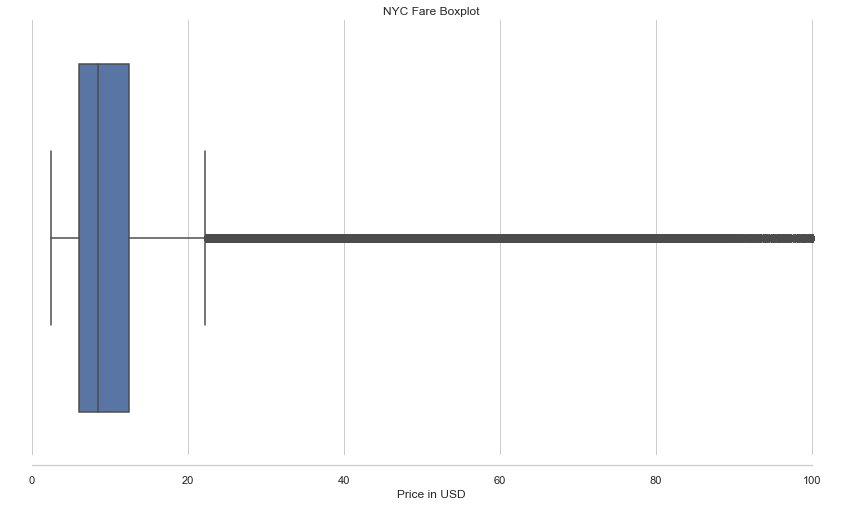

In [14]:
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

ax = sns.boxplot(x=taxi_train_data['fare_amount'])  

plt.title('NYC Fare Boxplot')

sns.despine(offset=10, trim=True)
ax.set(xlabel='Price in USD', ylabel='')

plt.show()

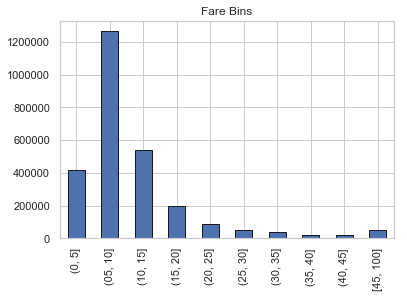

In [15]:
# Bin the fare and convert to string
taxi_train_data['fare-bin'] = pd.cut(taxi_train_data['fare_amount'], bins = list(range(0, 50, 5))).astype(str)

# Uppermost bin
taxi_train_data.loc[taxi_train_data['fare-bin'] == 'nan', 'fare-bin'] = '[45, 100]'

# Adjust bin so the sorting is correct
taxi_train_data.loc[taxi_train_data['fare-bin'] == '(5, 10]', 'fare-bin'] = '(05, 10]'

# Bar plot of value counts
taxi_train_data['fare-bin'].value_counts().sort_index().plot.bar(color = 'b', edgecolor = 'k');
plt.title('Fare Bins');

In [16]:
taxi_train_data = taxi_train_data.drop(['fare-bin'], axis=1)

In [17]:
taxi_train_data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,2688143.000,2688143.000,2688143.000,2688143.000,2688143.000
mean,11.260,-73.976,40.751,-73.975,40.751
std,9.309,0.034,0.027,0.034,0.031
min,2.500,-74.259,40.483,-74.259,40.478
25%,6.000,-73.992,40.737,-73.992,40.736
50%,8.500,-73.982,40.753,-73.981,40.754
75%,12.500,-73.968,40.767,-73.965,40.768
max,100.000,-73.701,40.917,-73.701,40.918


## Feature Engineering
#### Time and Date Features
Creating columns for:
- Year
- Month
- Day
- Hour
- Day of the Week

#### Distance Feature
Distance:
- Distance from pickup and dropoff locations

In [18]:
"""def morning_rush (row):
    if (row['hour'] <= 9) and (row['hour'] >= 6) and (row['weekday'] < 5):
        return 1
    else:
        return 0"""
"""
def mid_day (row):
    if (row['hour'] <= 15) and (row['hour'] >= 10):
        return 1
    else:
        return 0 
    
def late_night (row):
    if (row['hour'] <= 5) or (row['hour'] >= 20):
        return 1
    else:
        return 0    
    
    
def night_rush (row):
    if ((row['hour'] <= 20) and (row['hour'] >= 15)) and (row['weekday'] < 5):
        return 1
    else:
        return 0"""

def add_time_features(taxi_train_data):
    taxi_train_data['pickup_datetime'] =  pd.to_datetime(taxi_train_data['pickup_datetime'], format='%Y-%m-%d %H:%M:%S %Z')
    taxi_train_data['year'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.year)
    taxi_train_data['month'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.month)
    taxi_train_data['day'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.day)
    taxi_train_data['hour'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.hour)
    taxi_train_data['weekday'] = taxi_train_data['pickup_datetime'].apply(lambda x: x.weekday())
    #taxi_train_data['pickup_datetime'] =  taxi_train_data['pickup_datetime'].apply(lambda x: str(x))

    taxi_train_data = taxi_train_data.drop('pickup_datetime', axis=1)
    
    return taxi_train_data

def add_coordinate_features(taxi_train_data):
    lat1 = taxi_train_data['pickup_latitude']
    lat2 = taxi_train_data['dropoff_latitude']
    lon1 = taxi_train_data['pickup_longitude']
    lon2 = taxi_train_data['dropoff_longitude']
    
    # Add new features
    taxi_train_data['latdiff'] = (lat1 - lat2)
    taxi_train_data['londiff'] = (lon1 - lon2)

    return taxi_train_data


def add_distances_features(taxi_train_data):

    lat1 = taxi_train_data['pickup_latitude']
    lat2 = taxi_train_data['dropoff_latitude']
    lon1 = taxi_train_data['pickup_longitude']
    lon2 = taxi_train_data['dropoff_longitude']
    
    taxi_train_data['distance_traveled'] = (taxi_train_data['latdiff'] ** 2 + taxi_train_data['londiff'] ** 2) ** 0.5
    
    return taxi_train_data


In [19]:

taxi_train_data = add_time_features(taxi_train_data)
#taxi_train_data = add_time_features(taxi_train_data)

add_coordinate_features(taxi_train_data)
#add_coordinate_features(taxi_train_data)

taxi_train_data = add_distances_features(taxi_train_data)
#taxi_train_data = add_distances_features(taxi_train_data)

taxi_train_data.head(5)

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,year,month,day,hour,weekday,latdiff,londiff,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,2009,6,15,17,0,0.009,-0.003,0.009
1,16.900,-74.016,40.711,-73.979,40.782,2010,1,5,16,1,-0.071,-0.037,0.080
2,5.700,-73.983,40.761,-73.991,40.751,2011,8,18,0,3,0.011,0.009,0.014
3,7.700,-73.987,40.733,-73.992,40.758,2012,4,21,4,5,-0.025,0.004,0.025
4,5.300,-73.968,40.768,-73.957,40.784,2010,3,9,7,1,-0.016,-0.011,0.019


In [20]:
taxi_train_data.head()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,year,month,day,hour,weekday,latdiff,londiff,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,2009,6,15,17,0,0.009,-0.003,0.009
1,16.900,-74.016,40.711,-73.979,40.782,2010,1,5,16,1,-0.071,-0.037,0.080
2,5.700,-73.983,40.761,-73.991,40.751,2011,8,18,0,3,0.011,0.009,0.014
3,7.700,-73.987,40.733,-73.992,40.758,2012,4,21,4,5,-0.025,0.004,0.025
4,5.300,-73.968,40.768,-73.957,40.784,2010,3,9,7,1,-0.016,-0.011,0.019


## Taxi Cab Ride Frequency by hour

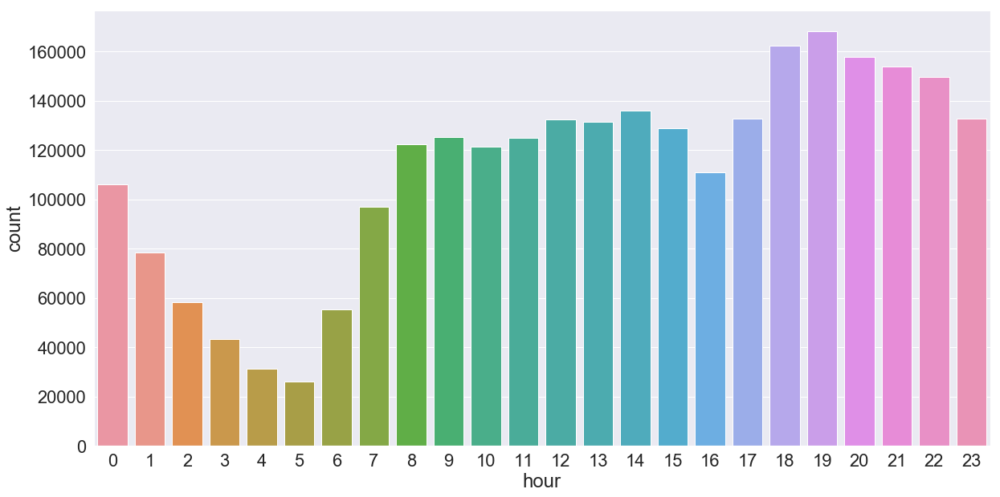

In [102]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['hour'].value_counts()
n_freq

n_df = pd.DataFrame({'hour':n_freq.index ,'count':n_freq.values})
n_df

sns.set(font_scale =2)

sns.barplot(x='hour', y='count', data=n_df, label = "medium")


## Taxi Cab Ride Frequency by Month

In [103]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['month'].value_counts()
n_freq

n_month = pd.DataFrame({'month':n_freq.index ,'count':n_freq.values})
n_month

sns.set(font_scale =2)
sns.barplot(x='month', y='count', data=n_month, label= "medium")


KeyError: 'month'

<Figure size 1440x720 with 0 Axes>

## Taxi Cab Ride Frequency by Day of Week

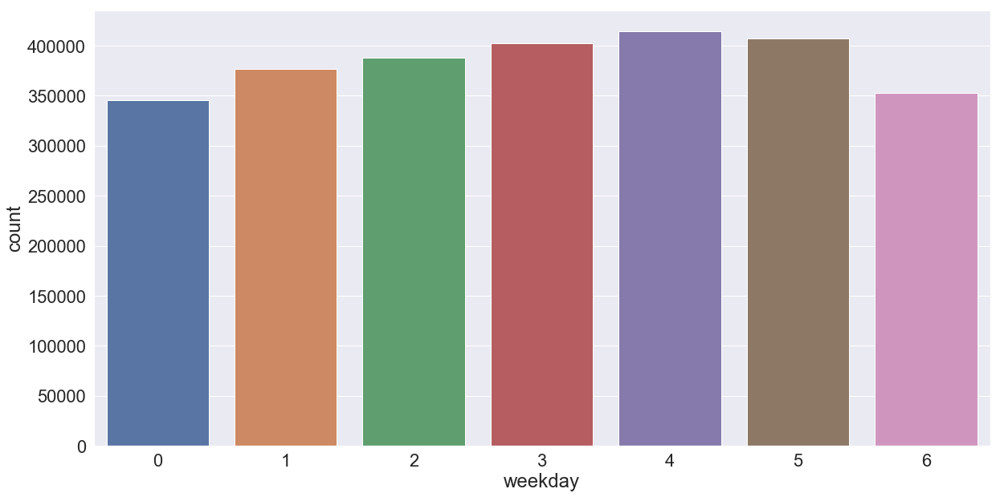

In [104]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['weekday'].value_counts()
n_freq

n_weekday = pd.DataFrame({'weekday':n_freq.index ,'count':n_freq.values})
n_weekday

sns.set(font_scale =2)

sns.barplot(x='weekday', y='count', data=n_weekday, label = "medium")


In [105]:
plt.figure(figsize=(20, 10))
n_freq=taxi_train_data['year'].value_counts()
n_freq

n_year = pd.DataFrame({'year':n_freq.index ,'count':n_freq.values})
n_year

sns.set(font_scale =2)

sns.barplot(x='year', y='count', data=n_year, label= "medium")


KeyError: 'year'

<Figure size 1440x720 with 0 Axes>

In [25]:
# this function will also be used with the test set below
def select_within_boundingbox(df, BB):
    return (taxi_train_data.pickup_longitude >= BB[0]) & (taxi_train_data.pickup_longitude <= BB[1]) & \
           (taxi_train_data.pickup_latitude >= BB[2]) & (taxi_train_data.pickup_latitude <= BB[3]) & \
           (taxi_train_data.dropoff_longitude >= BB[0]) & (taxi_train_data.dropoff_longitude <= BB[1]) & \
           (taxi_train_data.dropoff_latitude >= BB[2]) & (taxi_train_data.dropoff_latitude <= BB[3])
            
# load image of NYC map
BB = (-74.5, -72.8, 40.5, 41.8)
nyc_map = plt.imread('https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png')

# load extra image to zoom in on NYC
BB_zoom = (-74.3, -73.7, 40.5, 40.9)
nyc_map_zoom = plt.imread('https://aiblog.nl/download/nyc_-74.3_-73.7_40.5_40.9.png')

In [26]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(taxi_train_data.pickup_longitude, taxi_train_data.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(taxi_train_data.dropoff_longitude, taxi_train_data.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

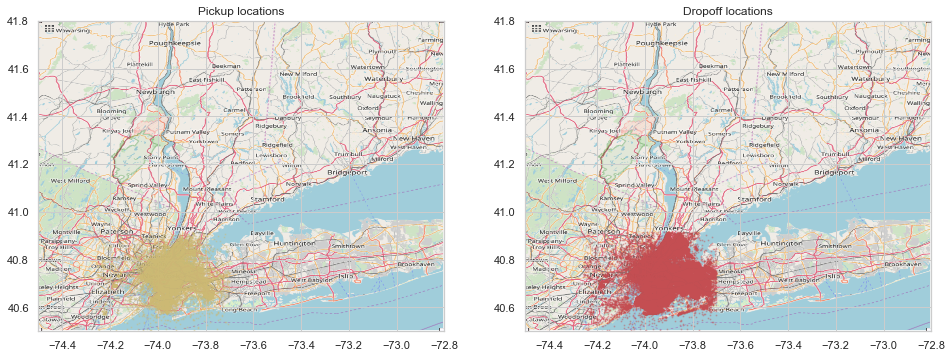

In [27]:
plot_on_map(taxi_train_data, BB, nyc_map, s=1, alpha=0.3)

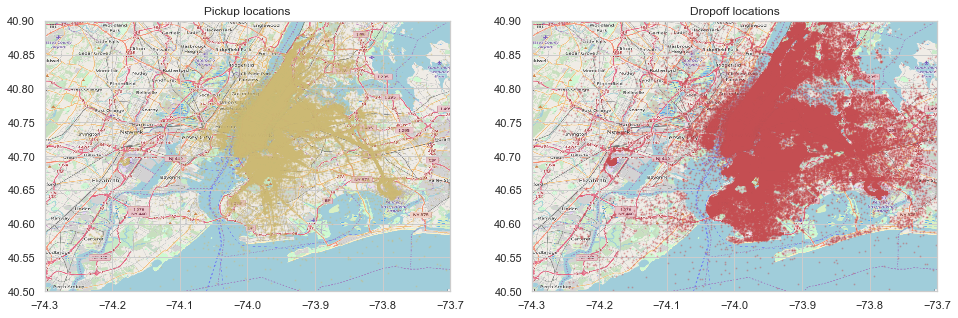

In [28]:
# plot training data on map zoomed in
plot_on_map(taxi_train_data, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [29]:
def plot_hires(taxi_train_data, BB, figsize=(12, 12), ax=None, c=('r', 'b')):
    if ax == None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)

    idx = select_within_boundingbox(taxi_train_data, BB)
    ax.scatter(taxi_train_data[idx].pickup_longitude, taxi_train_data[idx].pickup_latitude, c=c[0], s=0.01, alpha=0.5)
    ax.scatter(taxi_train_data[idx].dropoff_longitude, taxi_train_data[idx].dropoff_latitude, c=c[1], s=0.01, alpha=0.5)

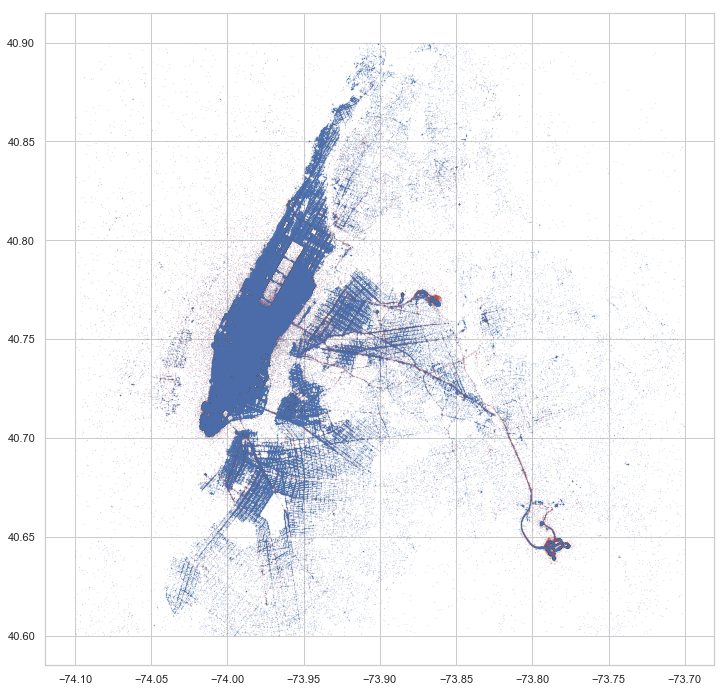

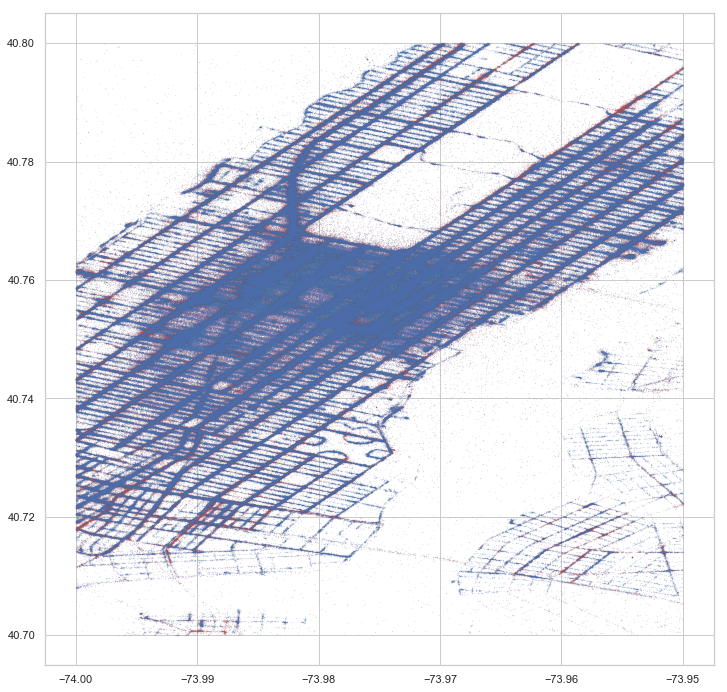

In [30]:
plot_hires(taxi_train_data, (-74.1, -73.7, 40.6, 40.9))
plot_hires(taxi_train_data, (-74, -73.95, 40.7, 40.8))

In [31]:
import folium

lat_center_jfk = 40.645626
lon_center_jfk = -73.785220

map_jfk_pk = folium.Map(location=[lat_center_jfk,lon_center_jfk],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)

folium.Marker(location = [lat_center_jfk,lon_center_jfk],
              icon = folium.Icon( icon="star",color = "blue")).add_to(map_jfk_pk)

#plotting 2500 dta points
for i in range(0,len(taxi_train_data[:10000])) :
    p = [taxi_train_data["pickup_latitude"][:10000].values[i],
        taxi_train_data["pickup_longitude"][:10000].values[i]]
    
    folium.Circle(location = p ,radius = 2,
                  color = "red").add_to(map_jfk_pk)
    

map_jfk_pk

In [32]:
"""dayOfWeek={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}
taxi_train_data['weekday'] = taxi_train_data['weekday'].map(dayOfWeek)"""

"dayOfWeek={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}\ntaxi_train_data['weekday'] = taxi_train_data['weekday'].map(dayOfWeek)"

In [33]:
"""taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['hour']))"""

"taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['hour']))"

In [34]:
"""taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['weekday']))"""

"taxi_train_data = taxi_train_data.join(pd.get_dummies(taxi_train_data['weekday']))"

In [35]:
"""taxi_train_data = taxi_train_data.drop( 'weekday', axis=1)"""

"taxi_train_data = taxi_train_data.drop( 'weekday', axis=1)"

In [36]:
taxi_train_data.head()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,year,month,day,hour,weekday,latdiff,londiff,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,2009,6,15,17,0,0.009,-0.003,0.009
1,16.900,-74.016,40.711,-73.979,40.782,2010,1,5,16,1,-0.071,-0.037,0.080
2,5.700,-73.983,40.761,-73.991,40.751,2011,8,18,0,3,0.011,0.009,0.014
3,7.700,-73.987,40.733,-73.992,40.758,2012,4,21,4,5,-0.025,0.004,0.025
4,5.300,-73.968,40.768,-73.957,40.784,2010,3,9,7,1,-0.016,-0.011,0.019


In [37]:
taxi_train_data.columns

Index(['fare_amount', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'year', 'month', 'day', 'hour',
       'weekday', 'latdiff', 'londiff', 'distance_traveled'],
      dtype='object')

In [38]:
"""taxi_train_data = taxi_train_data.drop( ['month','day','year', 'hour', 'latdiff','londiff'], axis=1)"""

"taxi_train_data = taxi_train_data.drop( ['month','day','year', 'hour', 'latdiff','londiff'], axis=1)"

In [39]:
taxi_train_data = taxi_train_data.drop( ['year', 'day', 'latdiff','londiff', 'month'], axis=1)

In [40]:
taxi_train_data.head(5)

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,17,0,0.009
1,16.900,-74.016,40.711,-73.979,40.782,16,1,0.080
2,5.700,-73.983,40.761,-73.991,40.751,0,3,0.014
3,7.700,-73.987,40.733,-73.992,40.758,4,5,0.025
4,5.300,-73.968,40.768,-73.957,40.784,7,1,0.019


In [41]:
#random.seed()

#import random

#random.seed(n)

In [42]:
from sklearn.preprocessing import normalize
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler



# Normalize the data.
"""X_norm = normalize(X)"""
X_cluster = taxi_train_data.copy()

mms = MinMaxScaler()
mms.fit(X_cluster)
data_transformed = mms.transform(X_cluster)

# Split the data into four equally-sized samples. First we break it in half:
"""X_half1, X_half2 = train_test_split(
    X_norm,
    test_size=0.5,
    random_state=None)
X1, X2 = train_test_split(
    X_half1,
    test_size=0.5,
    random_state=None)
X3, X4  = train_test_split(
    X_half2,
    test_size=0.5,
    random_state=None)"""

# Split the data into four equally-sized samples. First we break it in half:
X_half1, X_half2 = train_test_split(
    data_transformed,
    test_size=0.5,
    random_state=42)
X1, X2 = train_test_split(
    X_half1,
    test_size=0.5,
    random_state=42)
X3, X4  = train_test_split(
    X_half2,
    test_size=0.5,
    random_state=42)


c:\users\david\appdata\local\programs\python\python36\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


In [43]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans

Sum_of_squared_distances = []
K = range(1,12)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

7 Clusters. Investigated silhouette score was .30

2 clusters. silhouette score was 


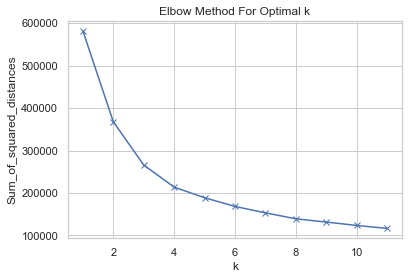

In [44]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [45]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
n_clusters = (2,3,4,5,6,7,8)
for n in n_clusters:
    print("Number of estimated clusters: {}".format(n))
    for sample in [data_transformed]:
        model = KMeans(n_clusters=n, random_state=42).fit(sample)
        labels = model.labels_
        print(metrics.silhouette_score(sample, labels, metric='euclidean', sample_size = 15000))

Number of estimated clusters: 2
0.33176262188712213
Number of estimated clusters: 3
0.33695307553835835
Number of estimated clusters: 4
0.30676972216645537
Number of estimated clusters: 5
0.28254941544366463
Number of estimated clusters: 6
0.288378111091075
Number of estimated clusters: 7
0.29743886179024664
Number of estimated clusters: 8
0.28164185191094343


In [46]:
model = KMeans(n_clusters=4, random_state=42).fit(data_transformed)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_cluster['clusters_all_set'] = labels

In [47]:
X_clusters = X_cluster.groupby(['clusters_all_set'], as_index=False).mean()
print(X_clusters)

   clusters_all_set  fare_amount  pickup_longitude  pickup_latitude  \
0                 0       11.150           -73.975           40.751   
1                 1       11.345           -73.974           40.752   
2                 2       11.391           -73.977           40.749   
3                 3       11.199           -73.975           40.751   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.976            40.751 17.666    4.973              0.033  
1            -73.974            40.752  8.979    0.973              0.033  
2            -73.973            40.750  6.029    4.406              0.035  
3            -73.975            40.752 18.807    1.678              0.033  


In [48]:
X_clusters

,clusters_all_set,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,11.150,-73.975,40.751,-73.976,40.751,17.666,4.973,0.033
1,1,11.345,-73.974,40.752,-73.974,40.752,8.979,0.973,0.033
2,2,11.391,-73.977,40.749,-73.973,40.750,6.029,4.406,0.035
3,3,11.199,-73.975,40.751,-73.975,40.752,18.807,1.678,0.033


### Create Dataframes for each cluster generated


In [49]:
cluster_0 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 0, :]
cluster_1 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 1, :]
cluster_2 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 2, :]
cluster_3 = X_cluster.loc[lambda df: X_cluster['clusters_all_set'] == 3, :]

### Cluster 0 information

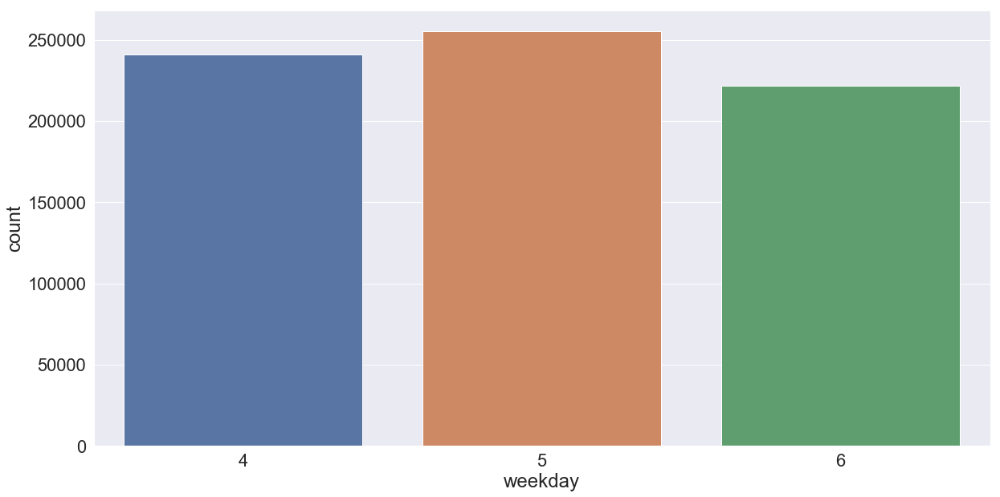

In [106]:
plt.figure(figsize=(20, 10))
Weekday_freq_0=cluster_0['weekday'].value_counts()
Weekday_freq_0

n_weekday_0 = pd.DataFrame({'weekday':Weekday_freq_0.index ,'count':Weekday_freq_0.values})
n_weekday_0

sns.set(font_scale =2)

sns.barplot(x='weekday', y='count', data=n_weekday_0, label = "medium")


In [50]:
cluster_0['weekday'].value_counts()

5    255443
4    240721
6    221482
Name: weekday, dtype: int64

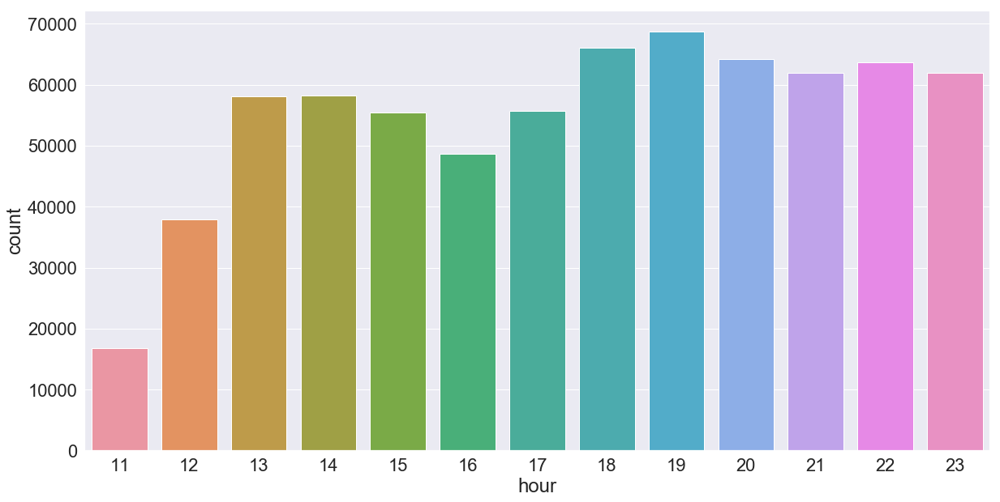

In [107]:
plt.figure(figsize=(20, 10))
hour_freq_0=cluster_0['hour'].value_counts()
hour_freq_0

hour_freq_0_df = pd.DataFrame({'hour':hour_freq_0.index ,'count':hour_freq_0.values})
hour_freq_0_df

sns.set(font_scale =2)

sns.barplot(x='hour', y='count', data=hour_freq_0_df, label = "medium")


In [51]:
cluster_0['hour'].value_counts()

19    68787
18    66077
20    64262
22    63660
23    61991
21    61940
14    58254
13    58111
17    55737
15    55506
16    48694
12    37897
11    16730
Name: hour, dtype: int64

Insights from the first cluster
- Represents travel on Friday, Saturday, Sunday.
- Travel between 11am and midnight.
- Majority of rides occuring in the early evening

### Cluster 1 information

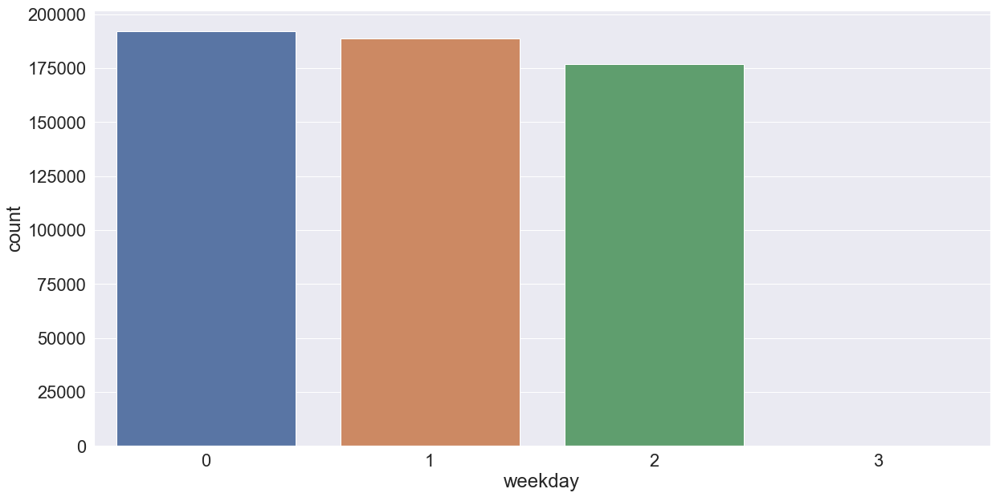

In [108]:
plt.figure(figsize=(20, 10))
Weekday_freq_1=cluster_1['weekday'].value_counts()
Weekday_freq_1

n_weekday_1 = pd.DataFrame({'weekday':Weekday_freq_1.index ,'count':Weekday_freq_1.values})
n_weekday_1

sns.set(font_scale =2)

sns.barplot(x='weekday', y='count', data=n_weekday_1, label = "medium")


In [52]:
cluster_1['weekday'].value_counts()

0    192184
1    188870
2    176858
3         1
Name: weekday, dtype: int64

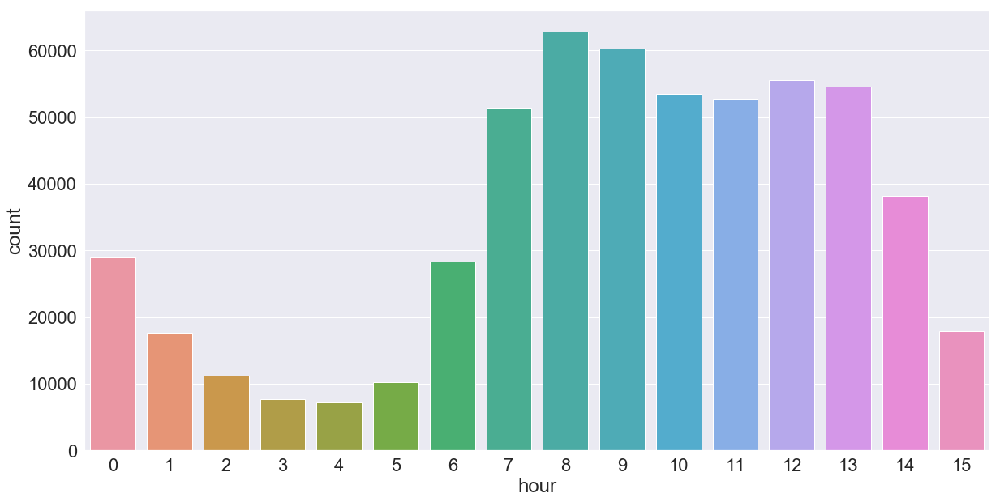

In [109]:
plt.figure(figsize=(20, 10))
hour_freq_1=cluster_1['hour'].value_counts()
hour_freq_1

hour_freq_1_df = pd.DataFrame({'hour':hour_freq_1.index ,'count':hour_freq_1.values})
hour_freq_1_df

sns.set(font_scale =2)

sns.barplot(x='hour', y='count', data=hour_freq_1_df, label = "medium")


In [53]:
cluster_1['hour'].value_counts()

8     62866
9     60284
12    55481
13    54529
10    53487
11    52750
7     51305
14    38210
0     28984
6     28287
15    17871
1     17641
2     11177
5     10177
3      7711
4      7153
Name: hour, dtype: int64

- Travel taken on Monday, Tuesday, and Wednesday
- Between the hours of midnight and 3pm 
- Majority of rides taking place between 8am and noon

### Cluster 2 Information 

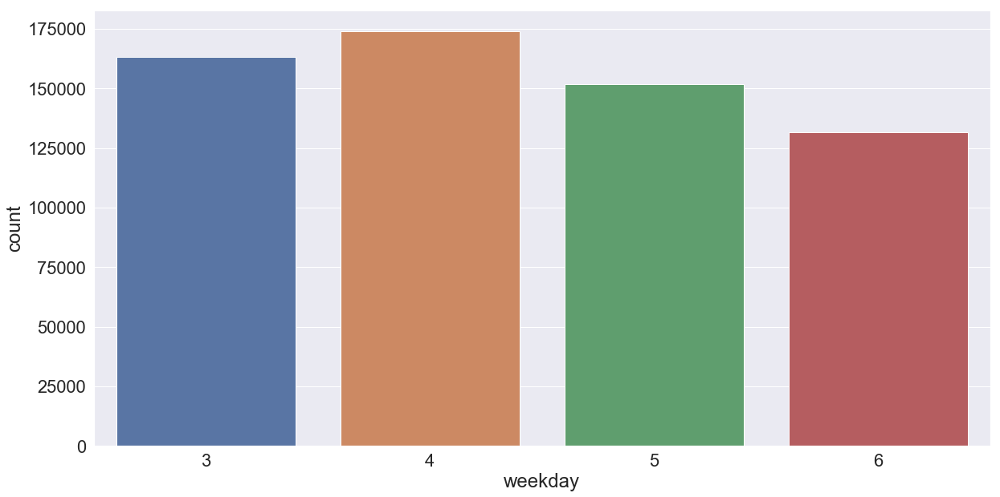

In [111]:
plt.figure(figsize=(20, 10))
Weekday_freq_2=cluster_2['weekday'].value_counts()
Weekday_freq_2

n_weekday_2 = pd.DataFrame({'weekday':Weekday_freq_2.index ,'count':Weekday_freq_2.values})
n_weekday_2

sns.set(font_scale =2)

sns.barplot(x='weekday', y='count', data=n_weekday_2, label = "medium")


In [54]:
cluster_2['weekday'].value_counts()

4    174087
3    163268
5    151872
6    131682
Name: weekday, dtype: int64

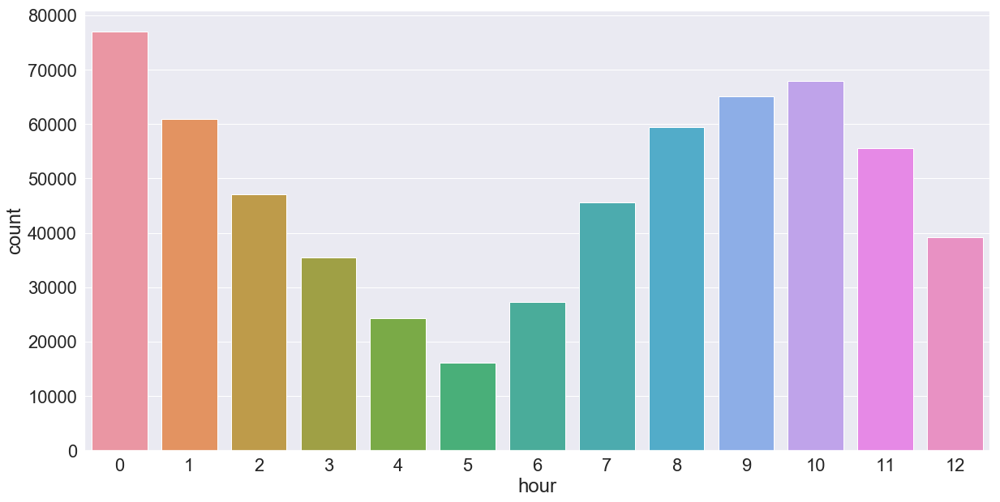

In [110]:
plt.figure(figsize=(20, 10))
hour_freq_2=cluster_2['hour'].value_counts()
hour_freq_2

hour_freq_2_df = pd.DataFrame({'hour':hour_freq_2.index ,'count':hour_freq_2.values})
hour_freq_2_df

sns.set(font_scale =2)

sns.barplot(x='hour', y='count', data=hour_freq_2_df, label = "medium")


In [55]:
cluster_2['hour'].value_counts()

0     77075
10    67947
9     65085
1     60866
8     59407
11    55624
2     47048
7     45628
12    39127
3     35508
6     27250
4     24275
5     16069
Name: hour, dtype: int64

- Trips taken on Wednesday through Sunday
- Trips taken between midnight and noon
- These trips comprise of some commute trips and some late night trips


### Cluster 3 Information

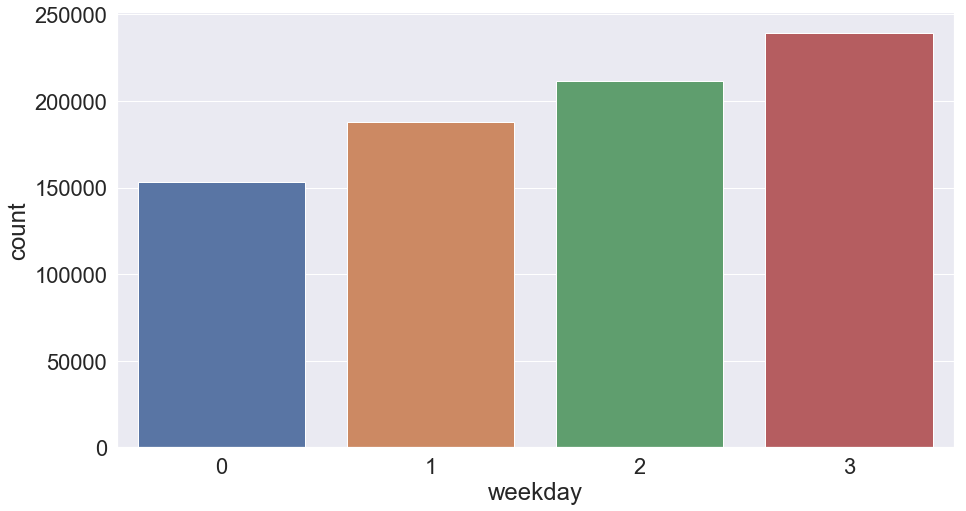

In [118]:
plt.figure(figsize=(15, 8))
Weekday_freq_3=cluster_3['weekday'].value_counts()
Weekday_freq_3

n_weekday_3 = pd.DataFrame({'weekday':Weekday_freq_3.index ,'count':Weekday_freq_3.values})
n_weekday_3

sns.set(font_scale =2)

sns.barplot(x='weekday', y='count', data=n_weekday_3, label = "medium")


In [56]:
cluster_3['weekday'].value_counts()

3    239167
2    211411
1    187966
0    153131
Name: weekday, dtype: int64

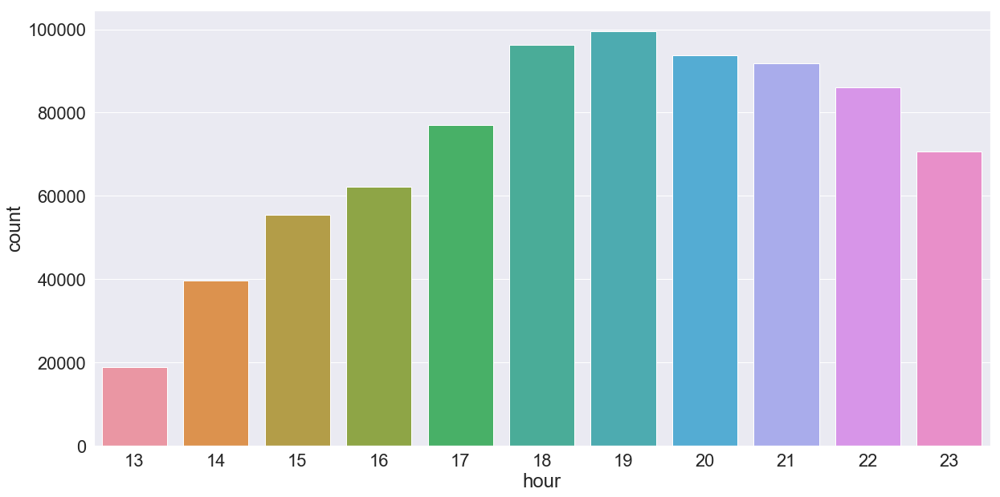

In [113]:
plt.figure(figsize=(20, 10))
hour_freq_3=cluster_3['hour'].value_counts()
hour_freq_3

hour_freq_3_df = pd.DataFrame({'hour':hour_freq_3.index ,'count':hour_freq_3.values})
hour_freq_3_df

sns.set(font_scale =2)

sns.barplot(x='hour', y='count', data=hour_freq_3_df, label = "medium")


In [57]:
cluster_3['hour'].value_counts()

19    99605
18    96223
20    93743
21    91857
22    86126
17    76954
23    70714
16    62264
15    55499
14    39725
13    18965
Name: hour, dtype: int64

- Trips taken on Monday through Thursday
- Trips taken between midnight and noon
- These trips comprise of some commute trips and some late night trips


Text(0.5,1,'Fare Price by Cluster')

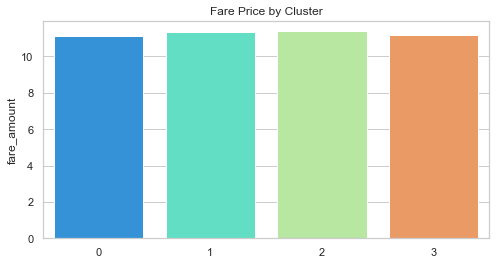

In [58]:
s = X_cluster.groupby(['clusters_all_set'], as_index=False).mean()['fare_amount']
g = sns.barplot(s.index, s, palette='rainbow')
g.figure.set_size_inches(8,4)
g.set_title("Fare Price by Cluster")

## Geoclustering

In [59]:

"""Cluster by 
time of day
day of week
location"""



X_locdf = taxi_train_data.copy()
X_loc = X_locdf[['pickup_longitude', 'pickup_latitude']]


#Show final feature count that goes into model
print('Location Feature Set has a shape of: {}'.format(X1.shape))



#Determine number of clusters using elbow plot
X_loc_norm = normalize(X_loc)

Location Feature Set has a shape of: (672035, 8)


In [60]:



def elbow_curve(ModX):
    
    differences = []
    for k in range(1, 12):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(ModX)
        differences.append(kmeans.inertia_)

    plt.figure(figsize=(15, 5))
    plt.plot(range(1, 12), differences)
    plt.xticks(np.arange(0, 31, 1))
    plt.grid(True)
    plt.title('Clusters Elbow Curve')

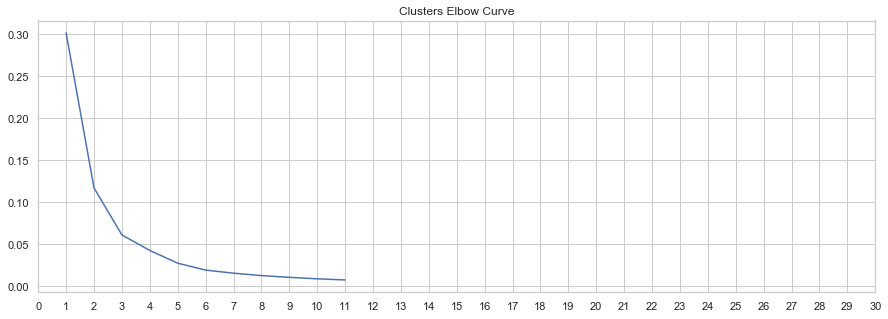

In [61]:

#Run on attendance
elbow_curve(X_loc_norm)

In [62]:
model = KMeans(n_clusters=6, random_state=42).fit(X_loc_norm)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_locdf['clusters_loc'] = labels

In [63]:

X_loc_clusters = X_locdf.groupby(['clusters_loc'], as_index=False).mean()
print(X_loc_clusters)

   clusters_loc  fare_amount  pickup_longitude  pickup_latitude  \
0             0        9.995           -73.959           40.779   
1             1       10.253           -73.994           40.731   
2             2       10.809           -73.971           40.760   
3             3       13.307           -74.004           40.706   
4             4       20.661           -73.909           40.790   
5             5       11.359           -73.979           40.745   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.966            40.767 13.459    2.985              0.029  
1            -73.983            40.739 12.855    3.300              0.030  
2            -73.972            40.757 14.044    2.892              0.032  
3            -73.984            40.729 13.508    3.100              0.042  
4            -73.956            40.767 13.927    2.966              0.071  
5            -73.977            40.748 13.549    2.991              0.034 

In [64]:
X_loc_clusters

,clusters_loc,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,9.995,-73.959,40.779,-73.966,40.767,13.459,2.985,0.029
1,1,10.253,-73.994,40.731,-73.983,40.739,12.855,3.300,0.030
2,2,10.809,-73.971,40.760,-73.972,40.757,14.044,2.892,0.032
3,3,13.307,-74.004,40.706,-73.984,40.729,13.508,3.100,0.042
4,4,20.661,-73.909,40.790,-73.956,40.767,13.927,2.966,0.071
5,5,11.359,-73.979,40.745,-73.977,40.748,13.549,2.991,0.034


In [65]:
import folium
#-74.5, -72.8, 40.5, 41.8
lat_center_nyc = 40.7128
lon_center_nyc = -74.0060

map_nyc_pk = folium.Map(location=[lat_center_nyc,lon_center_nyc],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)


#plotting 2500 dta points
for i in range(0,len(X_loc_clusters)) :
    p = [X_loc_clusters["pickup_latitude"].values[i],
        X_loc_clusters["pickup_longitude"].values[i]]
    
    folium.Circle(location = p ,radius = 4,
                  color = "red").add_to(map_nyc_pk)
    

map_nyc_pk

In [66]:
"""cluster_pred = KMeans(n_clusters=2, random_state=42).fit_predict(X)
X_pred = X.copy()
X_pred['cluster_assignment'] = cluster_pred

cluster_dataframes = {}
for n_clust in range(2):
    cluster_dataframes[n_clust] = X_pred.loc[X_pred['cluster_assignment'] == n_clust]

for name, frame in cluster_dataframes.items():
    print(name)
    print(frame.describe())"""

"cluster_pred = KMeans(n_clusters=2, random_state=42).fit_predict(X)\nX_pred = X.copy()\nX_pred['cluster_assignment'] = cluster_pred\n\ncluster_dataframes = {}\nfor n_clust in range(2):\n    cluster_dataframes[n_clust] = X_pred.loc[X_pred['cluster_assignment'] == n_clust]\n\nfor name, frame in cluster_dataframes.items():\n    print(name)\n    print(frame.describe())"

In [67]:
cluster_loc_1 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 1, :]
cluster_loc_2 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 2, :]
cluster_loc_3 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 3, :]
cluster_loc_4 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 4, :]
cluster_loc_5 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 5, :]
cluster_loc_6 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 6, :]

In [68]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_4.pickup_longitude, cluster_loc_4.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_4.dropoff_longitude, cluster_loc_4.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

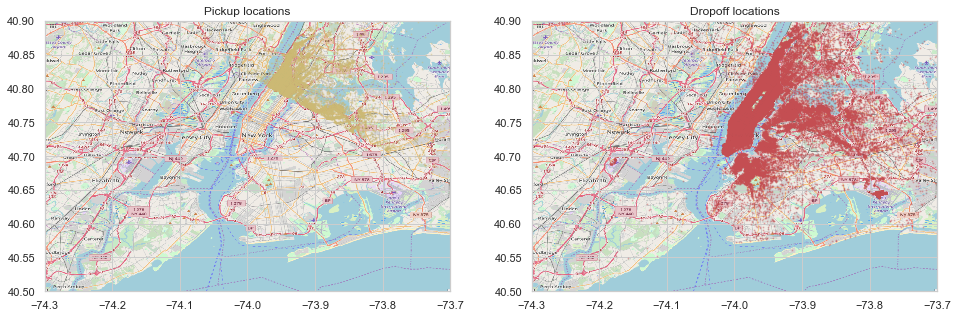

In [69]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_4, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [70]:
cluster_loc_3 = X_locdf.loc[lambda df: X_locdf['clusters_loc'] == 3, :]

In [71]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_3.pickup_longitude, cluster_loc_3.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_3.dropoff_longitude, cluster_loc_3.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

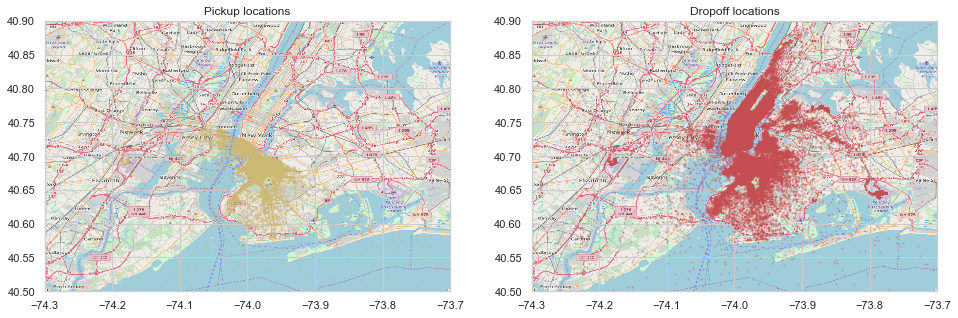

In [72]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_3, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [73]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_2.pickup_longitude, cluster_loc_2.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_2.dropoff_longitude, cluster_loc_2.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

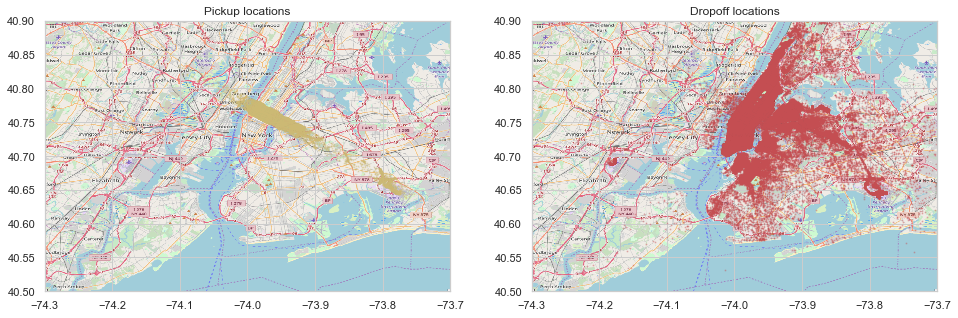

In [74]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_2, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [75]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_1.pickup_longitude, cluster_loc_1.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_1.dropoff_longitude, cluster_loc_1.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

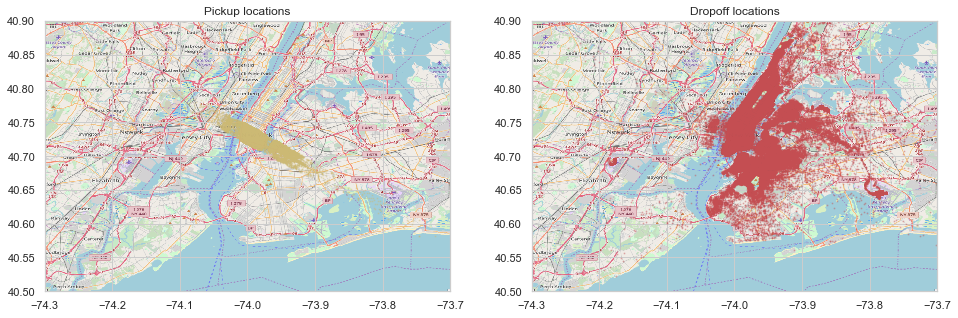

In [76]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_1, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

In [77]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(cluster_loc_5.pickup_longitude, cluster_loc_5.pickup_latitude, zorder=1, alpha=alpha, c='y', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(cluster_loc_5.dropoff_longitude, cluster_loc_5.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

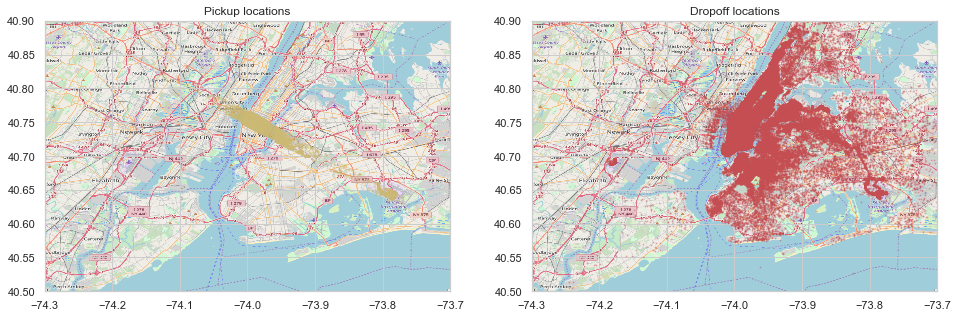

In [78]:
# plot training data on map zoomed in
plot_on_map(cluster_loc_5, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

Text(0.5,1,'Fare Price by Cluster')

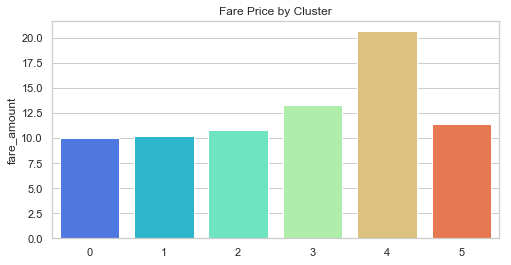

In [79]:
s = X_locdf.groupby(['clusters_loc'], as_index=False).mean()['fare_amount']
g = sns.barplot(s.index, s, palette='rainbow')
g.figure.set_size_inches(8,4)
g.set_title("Fare Price by Cluster")

## Cluster by day of the week 

In [81]:

"""Cluster by 
time of day
day of week
location"""



X_daydf = taxi_train_data.copy()
X_day = X_daydf[["weekday"]]


#Show final feature count that goes into model
print('Location Feature Set has a shape of: {}'.format(X1.shape))



#Determine number of clusters using elbow plot
X_day_norm = normalize(X_day)

Location Feature Set has a shape of: (672035, 8)


In [82]:
taxi_train_data.head(5)

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,4.500,-73.844,40.721,-73.842,40.712,17,0,0.009
1,16.900,-74.016,40.711,-73.979,40.782,16,1,0.080
2,5.700,-73.983,40.761,-73.991,40.751,0,3,0.014
3,7.700,-73.987,40.733,-73.992,40.758,4,5,0.025
4,5.300,-73.968,40.768,-73.957,40.784,7,1,0.019


c:\users\david\appdata\local\programs\python\python36\lib\site-packages\sklearn\cluster\k_means_.py:971: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return_n_iter=True)
c:\users\david\appdata\local\programs\python\python36\lib\site-packages\sklearn\cluster\k_means_.py:971: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return_n_iter=True)
c:\users\david\appdata\local\programs\python\python36\lib\site-packages\sklearn\cluster\k_means_.py:971: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return_n_iter=True)
c:\users\david\appdata\local\programs\python\python36\lib\site-packages\sklearn\cluster\k_means_.py:971: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (11). Possibly due to duplicate points in X.
  return

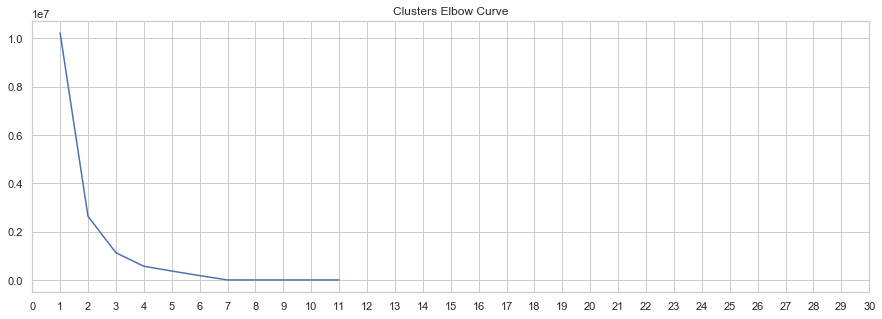

In [83]:

#Run on attendance
elbow_curve(X_day)

In [84]:
model = KMeans(n_clusters=7, random_state=42).fit(X_day)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_daydf['clusters_loc'] = labels

In [85]:

X_day_clusters = X_daydf.groupby(['clusters_loc'], as_index=False).mean()
print(X_day_clusters)

   clusters_loc  fare_amount  pickup_longitude  pickup_latitude  \
0             0       11.320           -73.976           40.751   
1             1       11.226           -73.976           40.752   
2             2       11.563           -73.975           40.749   
3             3       10.925           -73.978           40.749   
4             4       11.106           -73.975           40.752   
5             5       11.423           -73.976           40.751   
6             6       11.293           -73.973           40.752   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.975            40.751 13.638    4.000              0.033  
1            -73.975            40.752 13.943    2.000              0.033  
2            -73.973            40.750 11.944    6.000              0.037  
3            -73.976            40.750 13.045    5.000              0.033  
4            -73.975            40.752 14.064    1.000              0.033  
5      

In [86]:
X_day_clusters

,clusters_loc,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,11.320,-73.976,40.751,-73.975,40.751,13.638,4.000,0.033
1,1,11.226,-73.976,40.752,-73.975,40.752,13.943,2.000,0.033
2,2,11.563,-73.975,40.749,-73.973,40.750,11.944,6.000,0.037
3,3,10.925,-73.978,40.749,-73.976,40.750,13.045,5.000,0.033
4,4,11.106,-73.975,40.752,-73.975,40.752,14.064,1.000,0.033
5,5,11.423,-73.976,40.751,-73.975,40.752,13.959,3.000,0.034
6,6,11.293,-73.973,40.752,-73.974,40.752,13.902,0.000,0.035


Text(0.5,1,'Fare Price by Cluster')

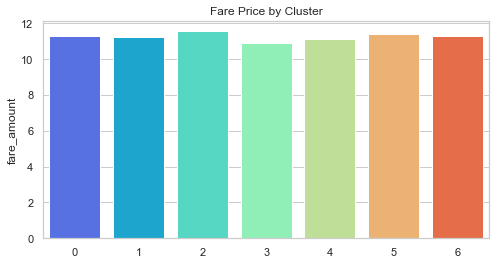

In [87]:
s = X_daydf.groupby(['clusters_loc'], as_index=False).mean()['fare_amount']
g = sns.barplot(s.index, s, palette='rainbow')
g.figure.set_size_inches(8,4)
g.set_title("Fare Price by Cluster")

In [88]:
import folium
#-74.5, -72.8, 40.5, 41.8
lat_center_nyc = 40.7128
lon_center_nyc = -74.0060

map_nyc_pk = folium.Map(location=[lat_center_nyc,lon_center_nyc],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)


#plotting 2500 dta points
for i in range(0,len(X_day_clusters)) :
    p = [X_daydf["pickup_latitude"].values[i],
        X_daydf["pickup_longitude"].values[i]]
    
    folium.Circle(location = p ,radius = 4,
                  color = "red").add_to(map_nyc_pk)
    

map_nyc_pk

In [89]:

"""Cluster by 
time of day
day of week
location"""



X_timedf = taxi_train_data.copy()
X_time = X_timedf[['hour']]


#Show final feature count that goes into model
print('Location Feature Set has a shape of: {}'.format(X1.shape))



#Determine number of clusters using elbow plot
X_time_norm = normalize(X_time)

Location Feature Set has a shape of: (672035, 8)


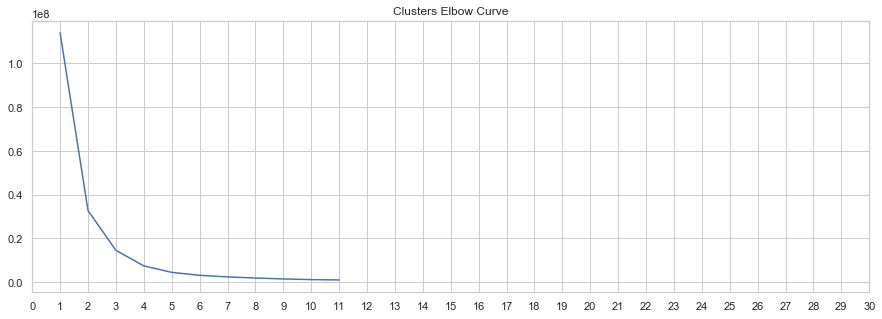

In [90]:

#Run on attendance
elbow_curve(X_time)

In [91]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
n_clusters = (2,3, 4, 5,6,7, 10, 15, 20)
for n in n_clusters:
    print("Number of estimated clusters: {}".format(n))
    for sample in [X_time]:
        model = KMeans(n_clusters=n, random_state=42).fit(sample)
        labels = model.labels_
        print(metrics.silhouette_score(sample, labels, metric='euclidean', sample_size = 15000))

Number of estimated clusters: 2
0.6102890972332204
Number of estimated clusters: 3
0.6103532994544412
Number of estimated clusters: 4
0.6023485925526927
Number of estimated clusters: 5
0.601794733626828
Number of estimated clusters: 6
0.6090083222009526
Number of estimated clusters: 7
0.6110354034867744
Number of estimated clusters: 10
0.6450921431070124
Number of estimated clusters: 15
0.7686978636291977
Number of estimated clusters: 20
0.9117497518329988


In [92]:
model = KMeans(n_clusters=3, random_state=42).fit(X_time)
labels = model.labels_
#print(metrics.silhouette_score(sample, labels, metric='euclidean'))

X_timedf['clusters_loc'] = labels

In [93]:

X_time_clusters = X_timedf.groupby(['clusters_loc'], as_index=False).mean()
print(X_time_clusters)

   clusters_loc  fare_amount  pickup_longitude  pickup_latitude  \
0             0       11.071           -73.976           40.750   
1             1       11.208           -73.974           40.754   
2             2       11.964           -73.979           40.744   

   dropoff_longitude  dropoff_latitude   hour  weekday  distance_traveled  
0            -73.976            40.751 19.586    2.964              0.033  
1            -73.975            40.753 11.172    2.866              0.032  
2            -73.969            40.746  2.291    3.760              0.041  


In [94]:
X_time_clusters

,clusters_loc,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,weekday,distance_traveled
0,0,11.071,-73.976,40.750,-73.976,40.751,19.586,2.964,0.033
1,1,11.208,-73.974,40.754,-73.975,40.753,11.172,2.866,0.032
2,2,11.964,-73.979,40.744,-73.969,40.746,2.291,3.760,0.041


In [95]:
import folium
#-74.5, -72.8, 40.5, 41.8
lat_center_nyc = 40.7128
lon_center_nyc = -74.0060

map_nyc_pk = folium.Map(location=[lat_center_nyc,lon_center_nyc],
                         tiles="OpenStreetMap",
                         max_zoom=15,zoom_start=15)


#plotting 2500 dta points
for i in range(0,len(X_time_clusters)) :
    p = [X_timedf["pickup_latitude"].values[i],
        X_timedf["pickup_longitude"].values[i]]
    
    folium.Circle(location = p ,radius = 4,
                  color = "red").add_to(map_nyc_pk)
    

map_nyc_pk

## Conclusions 

In [ ]:
Future apps